[INFO] Dataset directory created.
[TIME] 0.00 seconds
[INFO] Downloading image dataset...
[INFO] Extracting image dataset...
[INFO] Image dataset ready.
[TIME] 11.54 seconds
[INFO] Downloading captions dataset...
[INFO] Extracting captions dataset...
[INFO] Captions dataset ready.
[TIME] 0.70 seconds
[INFO] Captions parsed.
[TIME] 0.04 seconds
[INFO] Captions DataFrame created.
[TIME] 0.00 seconds


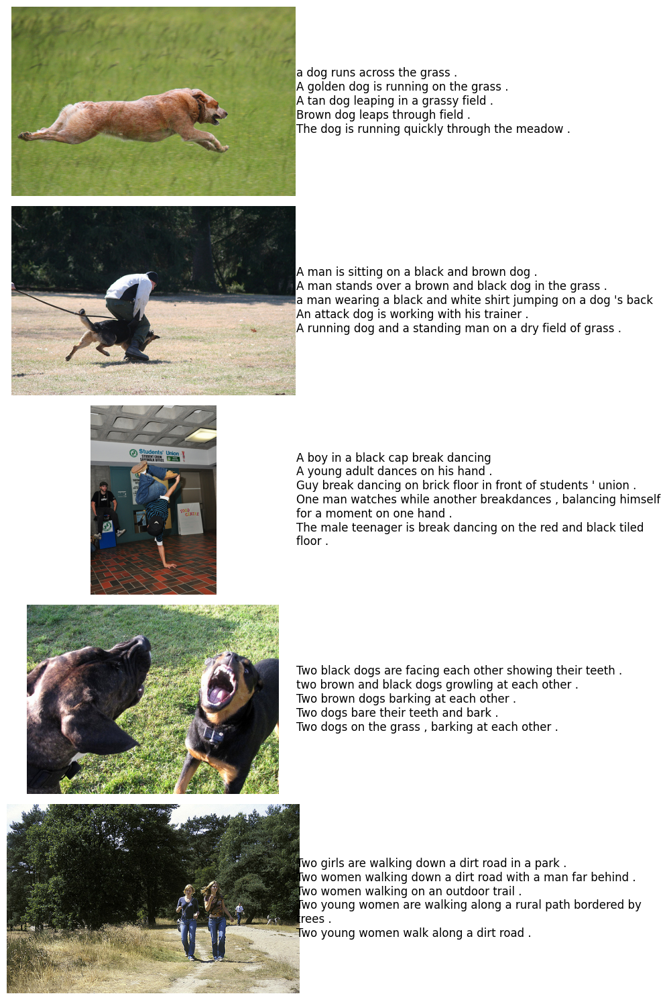

[INFO] Sample images displayed.
[TIME] 1.89 seconds


In [5]:
import os
import zipfile
import requests
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image
import time

FLICKR8K_IMAGES_URL = "https://github.com/jbrownlee/Datasets/releases/download/Flickr8k/Flickr8k_Dataset.zip"
FLICKR8K_CAPTIONS_URL = "https://github.com/jbrownlee/Datasets/releases/download/Flickr8k/Flickr8k_text.zip"

DATASET_PATH = "flickr8k_dataset"
IMAGES_PATH = os.path.join(DATASET_PATH, "Flicker8k_Dataset")
CAPTIONS_PATH = os.path.join(DATASET_PATH, "Flickr8k.token.txt")

start_time = time.time()
os.makedirs(DATASET_PATH, exist_ok=True)
print("[INFO] Dataset directory created.")
print(f"[TIME] {time.time() - start_time:.2f} seconds")

start_time = time.time()
images_zip_path = os.path.join(DATASET_PATH, "Flickr8k_Dataset.zip")
if not os.path.exists(IMAGES_PATH):
    print("[INFO] Downloading image dataset...")
    response = requests.get(FLICKR8K_IMAGES_URL, stream=True)
    with open(images_zip_path, "wb") as f:
        f.write(response.content)
    print("[INFO] Extracting image dataset...")
    with zipfile.ZipFile(images_zip_path, "r") as zip_ref:
        zip_ref.extractall(DATASET_PATH)
    os.remove(images_zip_path)
print("[INFO] Image dataset ready.")
print(f"[TIME] {time.time() - start_time:.2f} seconds")

start_time = time.time()
captions_zip_path = os.path.join(DATASET_PATH, "Flickr8k_text.zip")
if not os.path.exists(CAPTIONS_PATH):
    print("[INFO] Downloading captions dataset...")
    response = requests.get(FLICKR8K_CAPTIONS_URL, stream=True)
    with open(captions_zip_path, "wb") as f:
        f.write(response.content)
    print("[INFO] Extracting captions dataset...")
    with zipfile.ZipFile(captions_zip_path, "r") as zip_ref:
        zip_ref.extractall(DATASET_PATH)
    os.remove(captions_zip_path)
print("[INFO] Captions dataset ready.")
print(f"[TIME] {time.time() - start_time:.2f} seconds")

start_time = time.time()
captions_dict = {}
with open(CAPTIONS_PATH, "r") as f:
    lines = f.readlines()
    for line in lines[1:]:
        parts = line.strip().split("\t")
        image_name, caption = parts[0], parts[1]
        image_name = image_name.split("#")[0]
        if image_name not in captions_dict:
            captions_dict[image_name] = []
        captions_dict[image_name].append(caption)
print("[INFO] Captions parsed.")
print(f"[TIME] {time.time() - start_time:.2f} seconds")

start_time = time.time()
captions_df = pd.DataFrame([(k, v) for k, v in captions_dict.items()], columns=["image", "captions"])
print("[INFO] Captions DataFrame created.")
print(f"[TIME] {time.time() - start_time:.2f} seconds")

start_time = time.time()
num_samples = 5
fig, axes = plt.subplots(num_samples, 2, figsize=(10, 15))
for i, (image_name, captions) in enumerate(captions_df.sample(num_samples).values):
    image_path = os.path.join(IMAGES_PATH, image_name)
    image = Image.open(image_path)
    axes[i, 0].imshow(image)
    axes[i, 0].axis("off")
    axes[i, 1].text(0, 0.5, "\n".join(captions), fontsize=12, verticalalignment='center', wrap=True)
    axes[i, 1].axis("off")
plt.tight_layout()
plt.show()
print("[INFO] Sample images displayed.")
print(f"[TIME] {time.time() - start_time:.2f} seconds")


In [6]:
# Image Preprocessing
import torchvision.transforms as transforms
start_time = time.time()
def preprocess_image(image_path, target_size=(224, 224)):
    if not os.path.exists(image_path):
        return None  
    transform = transforms.Compose([
        transforms.Resize(target_size),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
    ])
    image = Image.open(image_path).convert("RGB")
    return transform(image)

captions_df["preprocessed_images"] = captions_df["image"].apply(lambda img: preprocess_image(os.path.join(IMAGES_PATH, img)))
captions_df = captions_df.dropna(subset=["preprocessed_images"])  # Remove missing images
print("[INFO] Images preprocessed.")
print(f"[TIME] {time.time() - start_time:.2f} seconds")

[INFO] Images preprocessed.
[TIME] 43.42 seconds


In [7]:
import json
import re
start_time = time.time()
def preprocess_caption(caption):
    caption = caption.lower()
    caption = re.sub(r'[^a-z\s]', '', caption)  
    return caption

captions_df["cleaned_captions"] = captions_df["captions"].apply(lambda caps: [preprocess_caption(cap) for cap in caps])
print("[INFO] Captions preprocessed.")
print(f"[TIME] {time.time() - start_time:.2f} seconds")
# Tokenization
start_time = time.time()
vocab = {"<pad>": 0, "<sos>": 1, "<eos>": 2, "<unk>": 3}
word_index = 4
for captions in captions_df["cleaned_captions"].values:
    for caption in captions:
        for word in caption.split():
            if word not in vocab:
                vocab[word] = word_index
                word_index += 1

with open(os.path.join(DATASET_PATH, "vocab.json"), "w") as f:
    json.dump(vocab, f)
print("[INFO] Vocabulary saved.")
print(f"[TIME] {time.time() - start_time:.2f} seconds")

# Caption Padding
start_time = time.time()
max_caption_length = 15
def tokenize_caption(caption, vocab, max_length=max_caption_length):
    tokens = [vocab.get(word, vocab["<unk>"]) for word in caption.split()]
    tokens = [vocab["<sos>"]] + tokens + [vocab["<eos>"]]
    if len(tokens) < max_length:
        tokens += [vocab["<pad>"]] * (max_length - len(tokens))
    return tokens[:max_length]

captions_df["tokenized_captions"] = captions_df["cleaned_captions"].apply(lambda caps: [tokenize_caption(cap, vocab) for cap in caps])
print("[INFO] Captions tokenized and padded.")
print(f"[TIME] {time.time() - start_time:.2f} seconds")


[INFO] Captions preprocessed.
[TIME] 0.08 seconds
[INFO] Vocabulary saved.
[TIME] 0.08 seconds
[INFO] Captions tokenized and padded.
[TIME] 0.29 seconds


In [8]:
# Data Splitting
from sklearn.model_selection import train_test_split
start_time = time.time()
train_imgs, temp_imgs = train_test_split(captions_df["preprocessed_images"].unique(), test_size=0.2, random_state=42)
val_imgs, test_imgs = train_test_split(temp_imgs, test_size=0.5, random_state=42)

train_df = captions_df[captions_df["preprocessed_images"].isin(train_imgs)]
val_df = captions_df[captions_df["preprocessed_images"].isin(val_imgs)]
test_df = captions_df[captions_df["preprocessed_images"].isin(test_imgs)]

print(f"[INFO] Dataset split: Train: {len(train_df)} | Validation: {len(val_df)} | Test: {len(test_df)}")
print(f"[TIME] {time.time() - start_time:.2f} seconds")

[INFO] Dataset split: Train: 6472 | Validation: 809 | Test: 810
[TIME] 9.74 seconds


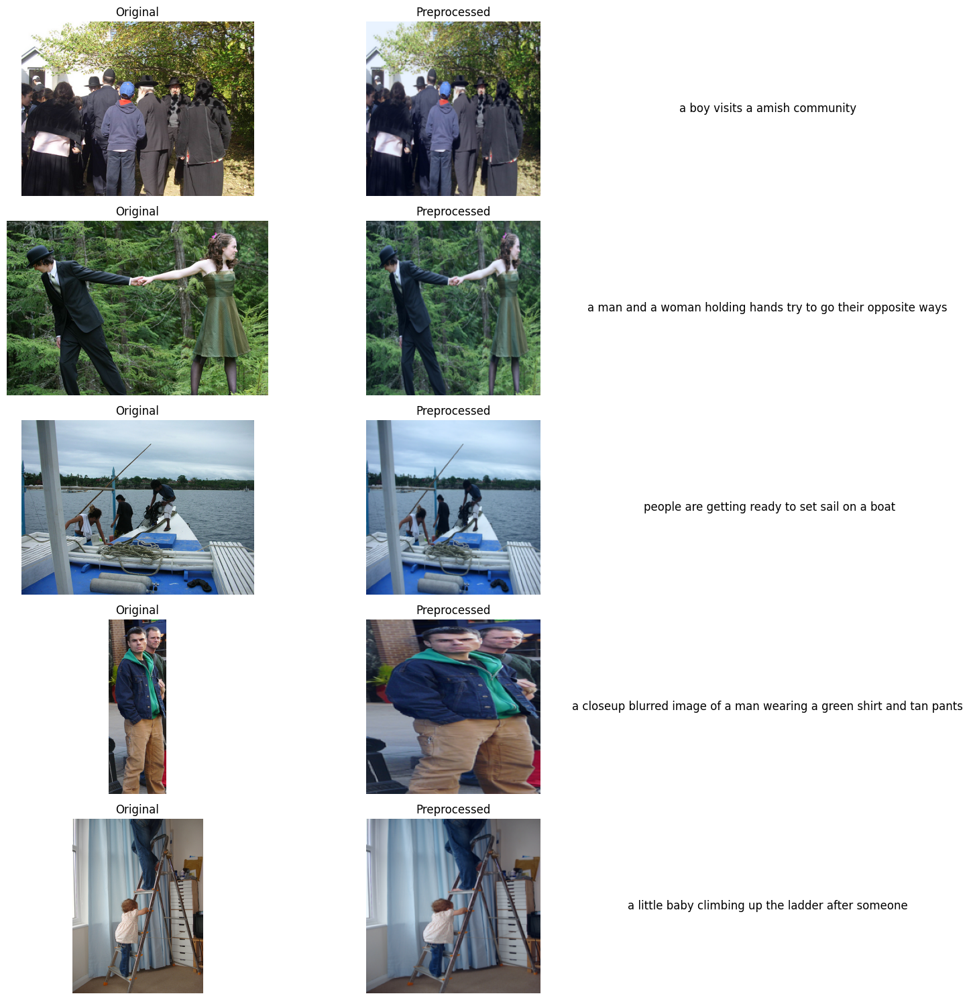

[INFO] Original and preprocessed images displayed with captions.
[TIME] 1.56 seconds


In [9]:
# Display Original and Preprocessed Images with Captions
start_time = time.time()
sample_images = captions_df.sample(5)
fig, axes = plt.subplots(5, 3, figsize=(15, 15))
for i, row in enumerate(sample_images.itertuples()):
    image_path = os.path.join(IMAGES_PATH, row.image)
    original_image = Image.open(image_path)
    preprocessed_image = row.preprocessed_images.permute(1, 2, 0).numpy()
    preprocessed_image = (preprocessed_image - preprocessed_image.min()) / (preprocessed_image.max() - preprocessed_image.min())
    
    axes[i, 0].imshow(original_image)
    axes[i, 0].axis("off")
    axes[i, 0].set_title("Original")
    
    axes[i, 1].imshow(preprocessed_image)
    axes[i, 1].axis("off")
    axes[i, 1].set_title("Preprocessed")
    
    axes[i, 2].text(0.5, 0.5, " ".join(row.cleaned_captions[:1]), fontsize=12, ha='center', va='center', wrap=True)
    axes[i, 2].axis("off")

plt.tight_layout()
plt.show()
print("[INFO] Original and preprocessed images displayed with captions.")
print(f"[TIME] {time.time() - start_time:.2f} seconds")

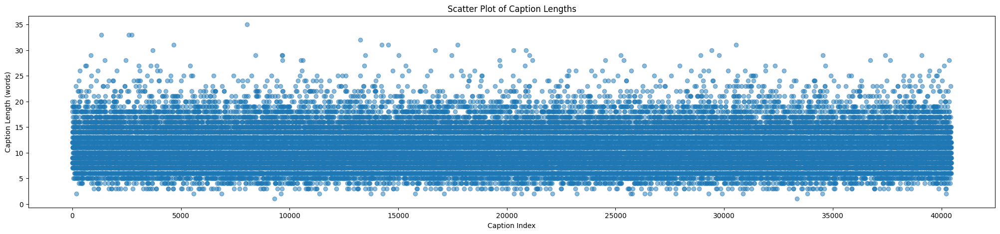

[INFO] Scatter plot of caption lengths displayed.
[TIME] 0.48 seconds


In [10]:
# Scatter Plot of Caption Lengths
start_time = time.time()
caption_lengths = [len(cap.split()) for sublist in captions_df["cleaned_captions"] for cap in sublist]
plt.figure(figsize=(25, 5))
plt.scatter(range(len(caption_lengths)), caption_lengths, alpha=0.5)
plt.xlabel("Caption Index")
plt.ylabel("Caption Length (words)")
plt.title("Scatter Plot of Caption Lengths")
plt.show()
print("[INFO] Scatter plot of caption lengths displayed.")
print(f"[TIME] {time.time() - start_time:.2f} seconds")

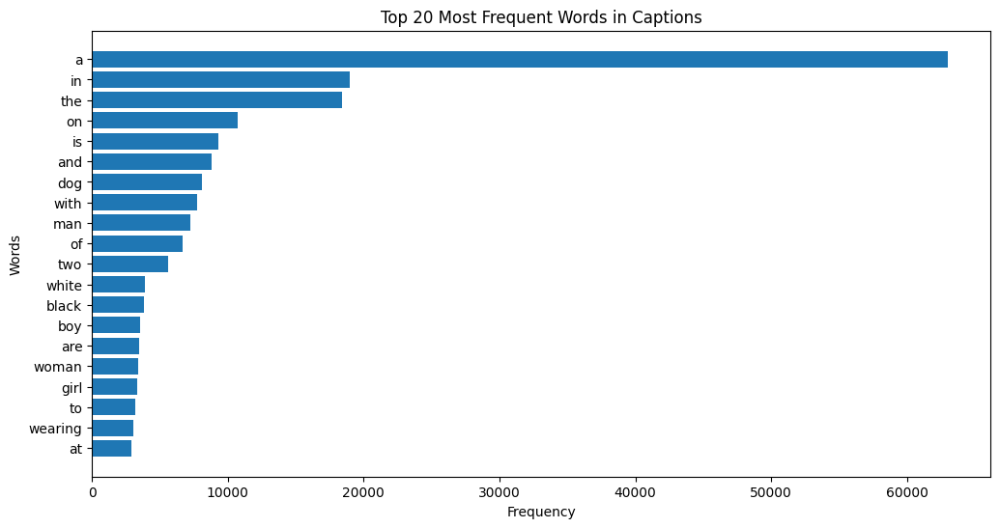

[INFO] Histogram of top 20 words displayed.
[TIME] 0.33 seconds
[nltk_data] Downloading package stopwords to /usr/share/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


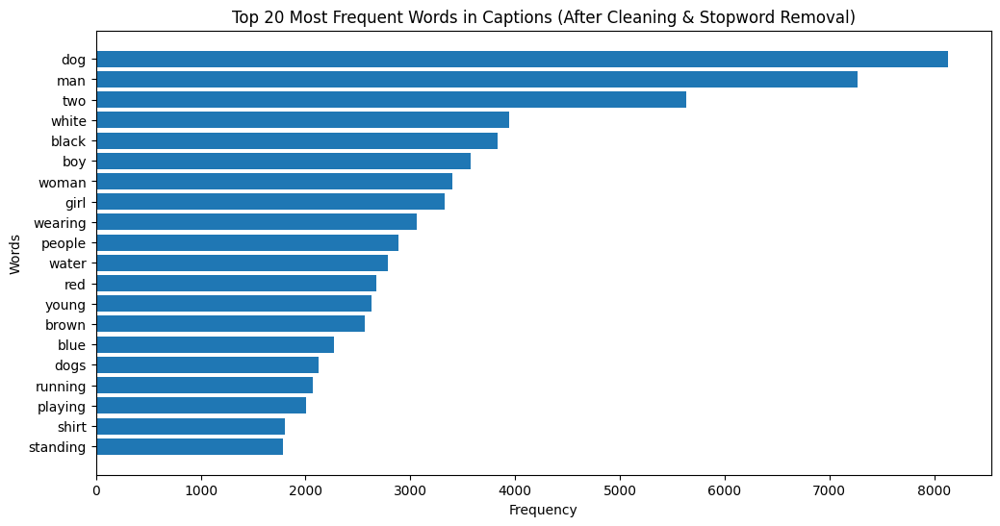

[INFO] Histograms of top 20 words displayed (before and after cleaning + stopword removal).
[TIME] 1.40 seconds


In [11]:
# Histogram of Top 20 Most Frequent Words
from collections import Counter
start_time = time.time()
all_words = [word for sublist in captions_df["cleaned_captions"] for caption in sublist for word in caption.split()]
word_counts = Counter(all_words)
most_common_words = word_counts.most_common(20)

words, counts = zip(*most_common_words)
plt.figure(figsize=(12, 6))
plt.barh(words[::-1], counts[::-1])  # Reverse to display highest at the top
plt.xlabel("Frequency")
plt.ylabel("Words")
plt.title("Top 20 Most Frequent Words in Captions")
plt.show()

print("[INFO] Histogram of top 20 words displayed.")
print(f"[TIME] {time.time() - start_time:.2f} seconds")

from nltk.corpus import stopwords
import nltk

nltk.download('stopwords')
stop_words = set(stopwords.words('english'))
# Histogram of Top 20 Most Frequent Words (After Cleaning and Removing Stopwords)
all_words_cleaned = [word for sublist in captions_df["cleaned_captions"] for caption in sublist for word in caption.split() if word not in stop_words]
word_counts_cleaned = Counter(all_words_cleaned)
most_common_words_cleaned = word_counts_cleaned.most_common(20)

words_cleaned, counts_cleaned = zip(*most_common_words_cleaned)
plt.figure(figsize=(12, 6))
plt.barh(words_cleaned[::-1], counts_cleaned[::-1])  # Reverse to display highest at the top
plt.xlabel("Frequency")
plt.ylabel("Words")
plt.title("Top 20 Most Frequent Words in Captions (After Cleaning & Stopword Removal)")
plt.show()

print("[INFO] Histograms of top 20 words displayed (before and after cleaning + stopword removal).")
print(f"[TIME] {time.time() - start_time:.2f} seconds")

Epoch 1/50:   0%|          | 1/203 [00:00<00:30,  6.72it/s, loss=9.09]

[INFO] Encoder output shape: torch.Size([32, 256])
[INFO] Decoder output shape: torch.Size([32, 15, 8781])


Epoch 1/50: 100%|██████████| 203/203 [00:30<00:00,  6.61it/s, loss=5.75]


[INFO] Checkpoint saved at epoch 0
Epoch 1/50, Loss: 5.6610


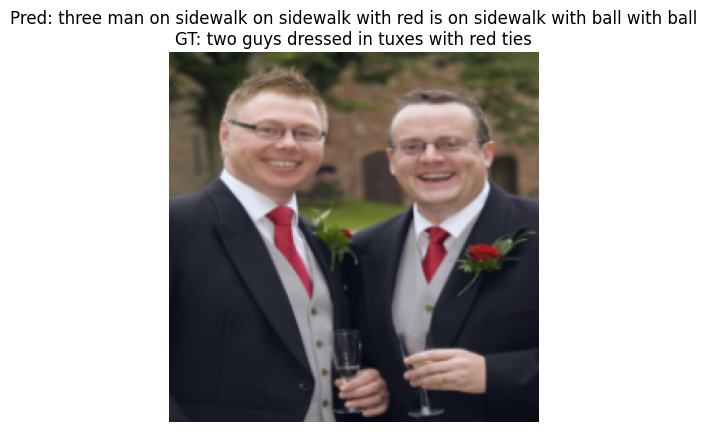

Epoch 2/50: 100%|██████████| 203/203 [00:30<00:00,  6.59it/s, loss=5.37]


[INFO] Checkpoint saved at epoch 1
Epoch 2/50, Loss: 5.1677


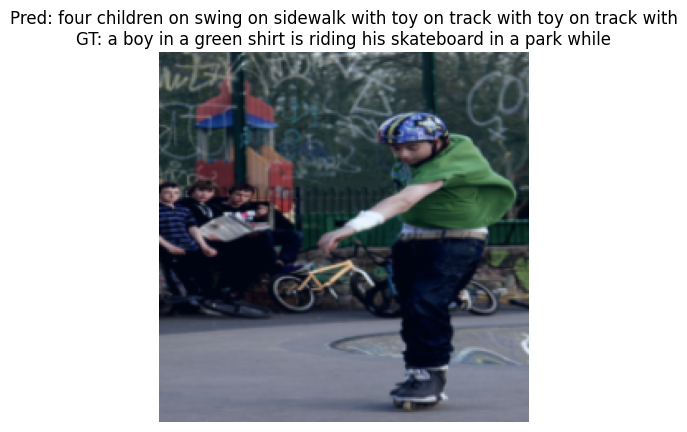

Epoch 3/50: 100%|██████████| 203/203 [00:30<00:00,  6.59it/s, loss=4.82]


[INFO] Checkpoint saved at epoch 2
Epoch 3/50, Loss: 5.0121


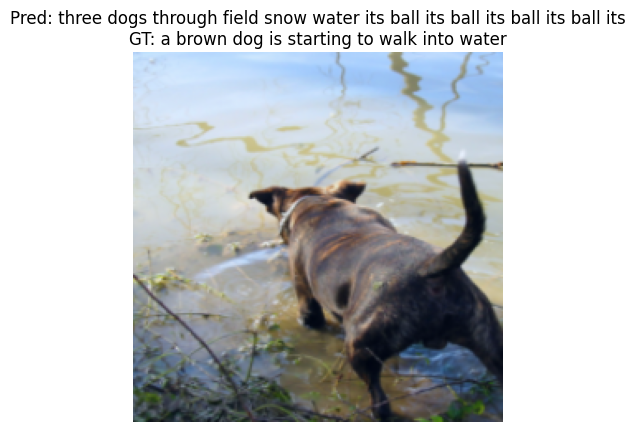

Epoch 4/50: 100%|██████████| 203/203 [00:30<00:00,  6.61it/s, loss=4.64]


[INFO] Checkpoint saved at epoch 3
Epoch 4/50, Loss: 4.8986


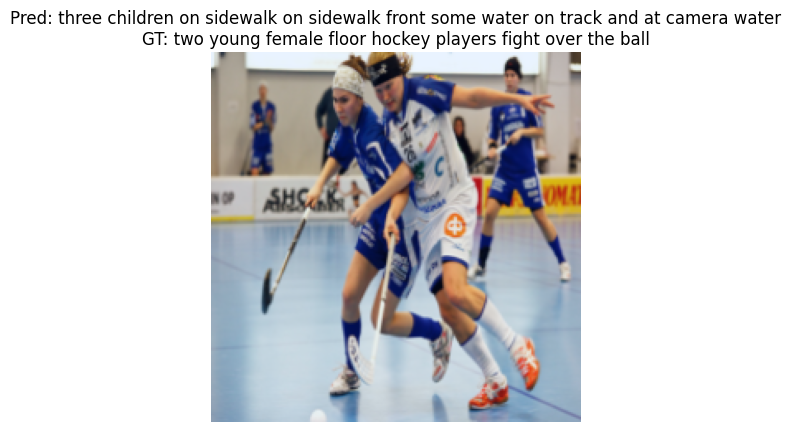

Epoch 5/50: 100%|██████████| 203/203 [00:30<00:00,  6.59it/s, loss=4.17]


[INFO] Checkpoint saved at epoch 4
Epoch 5/50, Loss: 4.8193


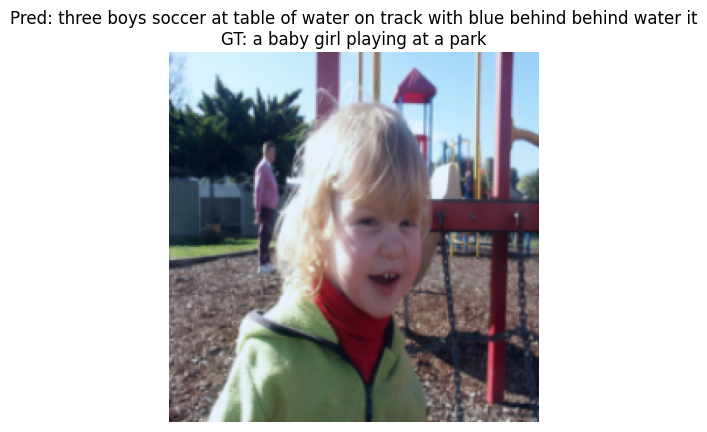

Epoch 6/50: 100%|██████████| 203/203 [00:30<00:00,  6.62it/s, loss=4.76]


[INFO] Checkpoint saved at epoch 5
Epoch 6/50, Loss: 4.7380


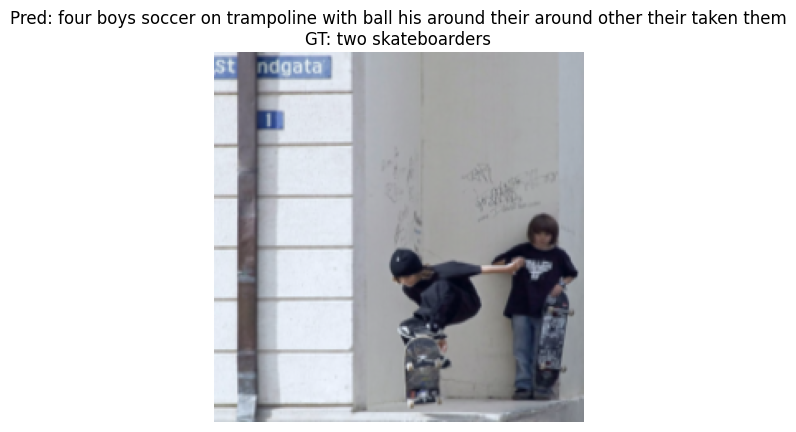

Epoch 7/50: 100%|██████████| 203/203 [00:30<00:00,  6.60it/s, loss=4.91]


[INFO] Checkpoint saved at epoch 6
Epoch 7/50, Loss: 4.6740


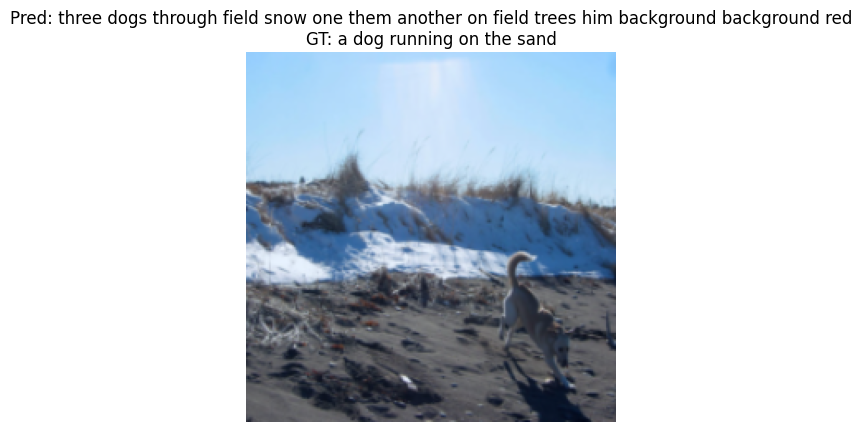

Epoch 8/50: 100%|██████████| 203/203 [00:30<00:00,  6.59it/s, loss=4.64]


[INFO] Checkpoint saved at epoch 7
Epoch 8/50, Loss: 4.6359


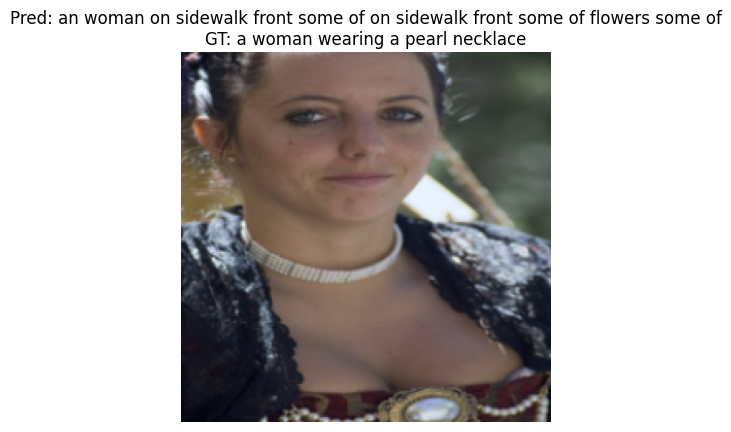

Epoch 9/50: 100%|██████████| 203/203 [00:30<00:00,  6.61it/s, loss=4.99]


[INFO] Checkpoint saved at epoch 8
Epoch 9/50, Loss: 4.5857


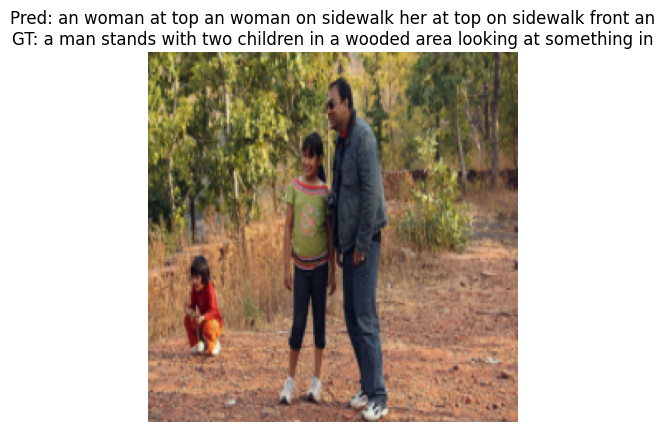

Epoch 10/50: 100%|██████████| 203/203 [00:30<00:00,  6.60it/s, loss=4.58]


[INFO] Checkpoint saved at epoch 9
Epoch 10/50, Loss: 4.5265


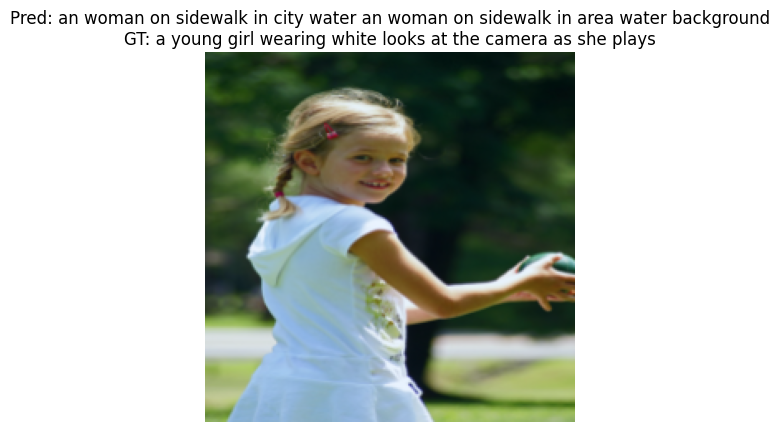

Epoch 11/50: 100%|██████████| 203/203 [00:30<00:00,  6.61it/s, loss=4.19]


[INFO] Checkpoint saved at epoch 10
Epoch 11/50, Loss: 4.4752


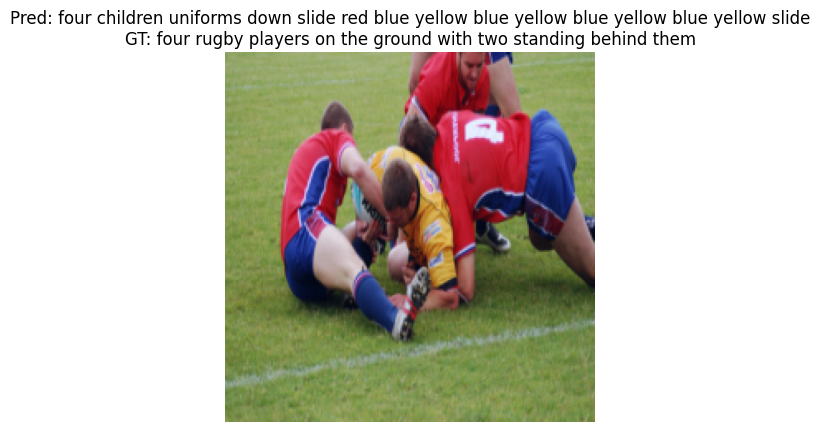

Epoch 12/50: 100%|██████████| 203/203 [00:30<00:00,  6.59it/s, loss=4.79]


[INFO] Checkpoint saved at epoch 11
Epoch 12/50, Loss: 4.4361


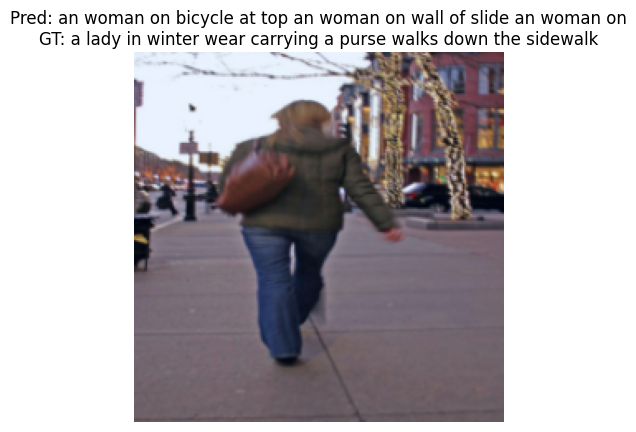

Epoch 13/50: 100%|██████████| 203/203 [00:30<00:00,  6.63it/s, loss=4.32]


[INFO] Checkpoint saved at epoch 12
Epoch 13/50, Loss: 4.3895


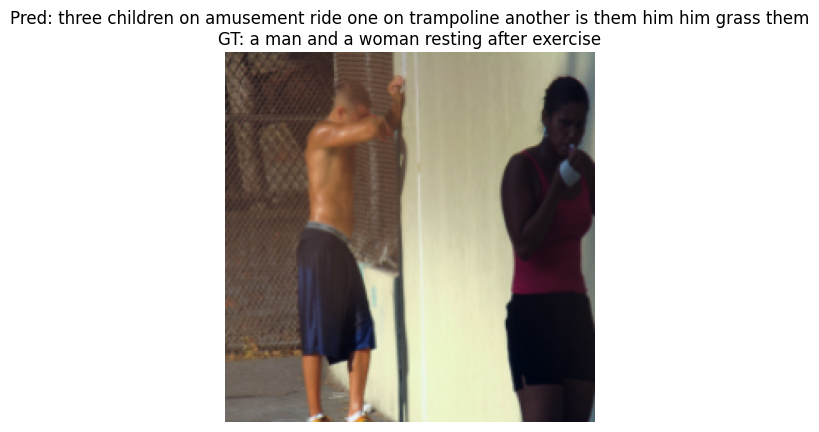

Epoch 14/50: 100%|██████████| 203/203 [00:30<00:00,  6.61it/s, loss=4.7] 


[INFO] Checkpoint saved at epoch 13
Epoch 14/50, Loss: 4.3493


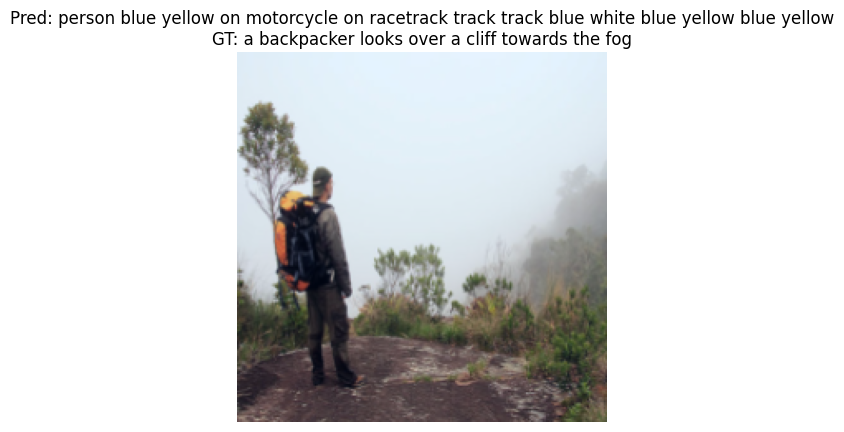

Epoch 15/50: 100%|██████████| 203/203 [00:30<00:00,  6.59it/s, loss=4.24]


[INFO] Checkpoint saved at epoch 14
Epoch 15/50, Loss: 4.3003


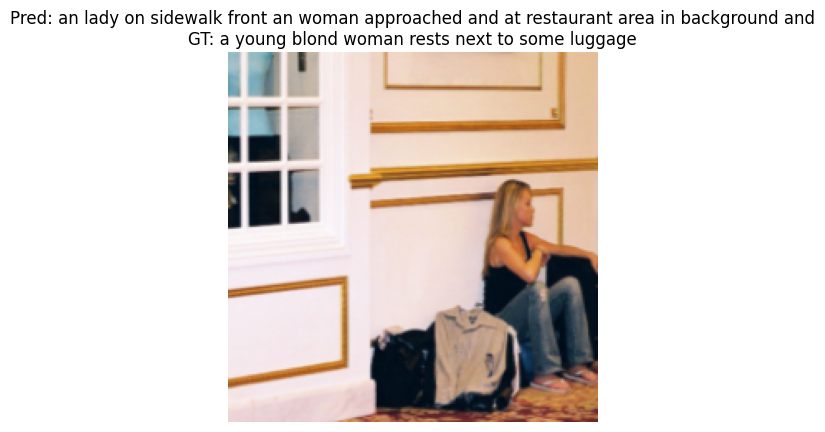

Epoch 16/50: 100%|██████████| 203/203 [00:30<00:00,  6.62it/s, loss=3.79]


[INFO] Checkpoint saved at epoch 15
Epoch 16/50, Loss: 4.2483


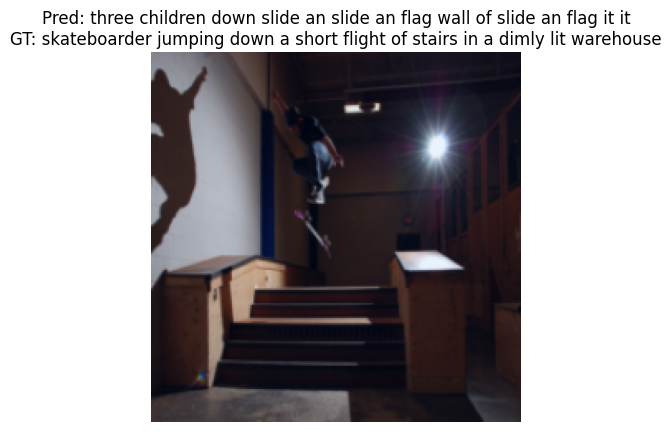

Epoch 17/50: 100%|██████████| 203/203 [00:30<00:00,  6.61it/s, loss=3.98]


[INFO] Checkpoint saved at epoch 16
Epoch 17/50, Loss: 4.2251


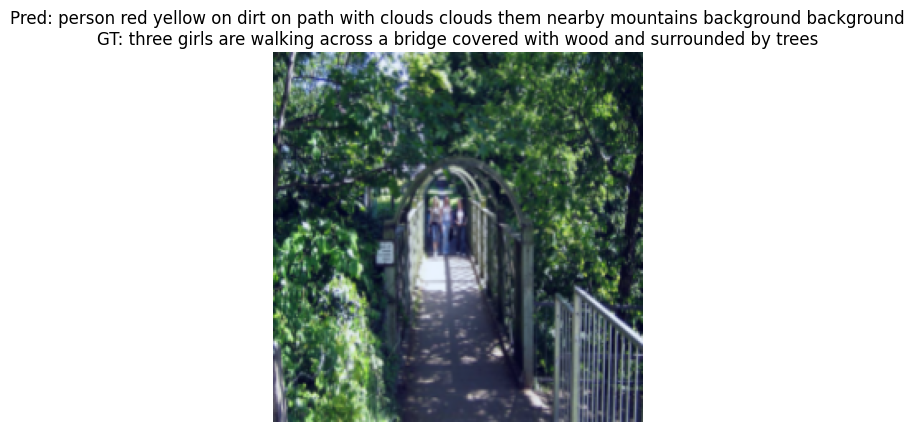

Epoch 18/50: 100%|██████████| 203/203 [00:30<00:00,  6.62it/s, loss=4.19]


[INFO] Checkpoint saved at epoch 17
Epoch 18/50, Loss: 4.1818


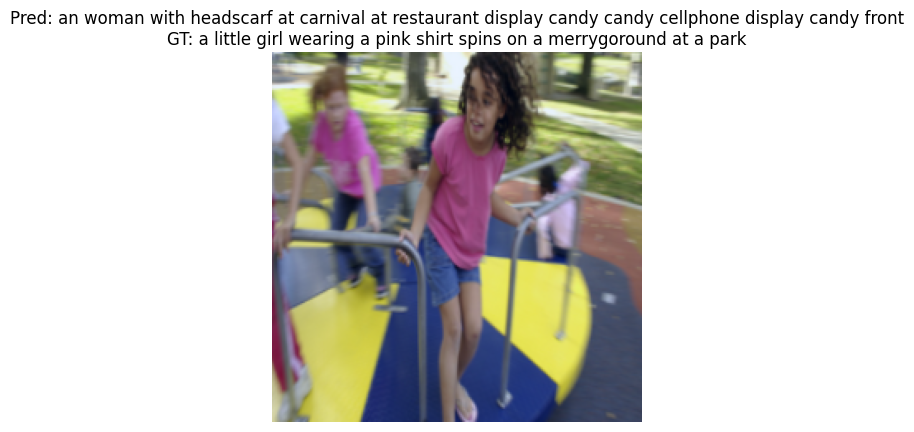

Epoch 19/50: 100%|██████████| 203/203 [00:30<00:00,  6.60it/s, loss=4.49]


[INFO] Checkpoint saved at epoch 18
Epoch 19/50, Loss: 4.1436


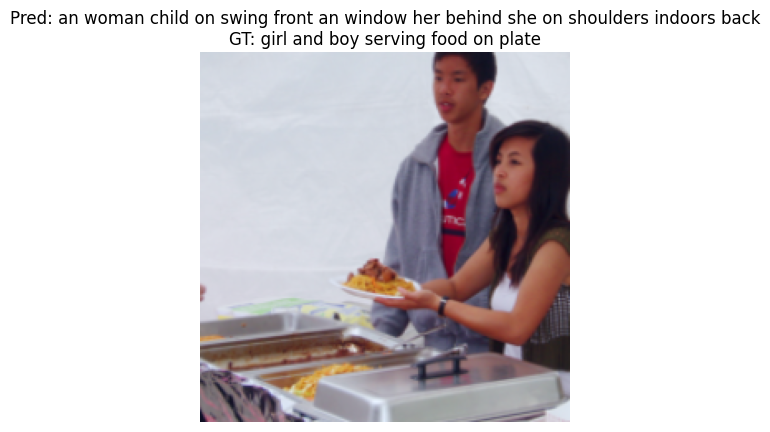

Epoch 20/50: 100%|██████████| 203/203 [00:30<00:00,  6.62it/s, loss=4.25]


[INFO] Checkpoint saved at epoch 19
Epoch 20/50, Loss: 4.0868


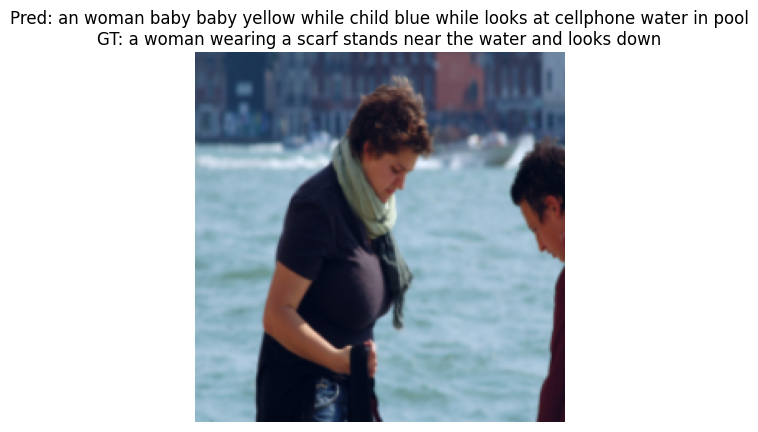

Epoch 21/50: 100%|██████████| 203/203 [00:30<00:00,  6.59it/s, loss=3.86]


[INFO] Checkpoint saved at epoch 20
Epoch 21/50, Loss: 4.0616


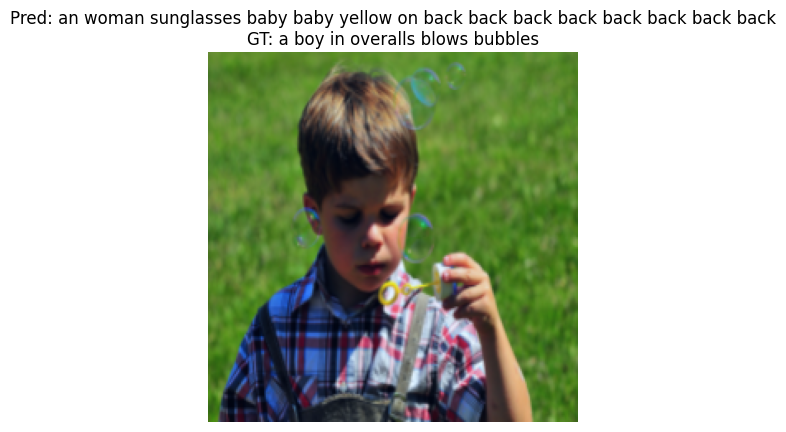

Epoch 22/50: 100%|██████████| 203/203 [00:30<00:00,  6.61it/s, loss=3.97]


[INFO] Checkpoint saved at epoch 21
Epoch 22/50, Loss: 4.0015


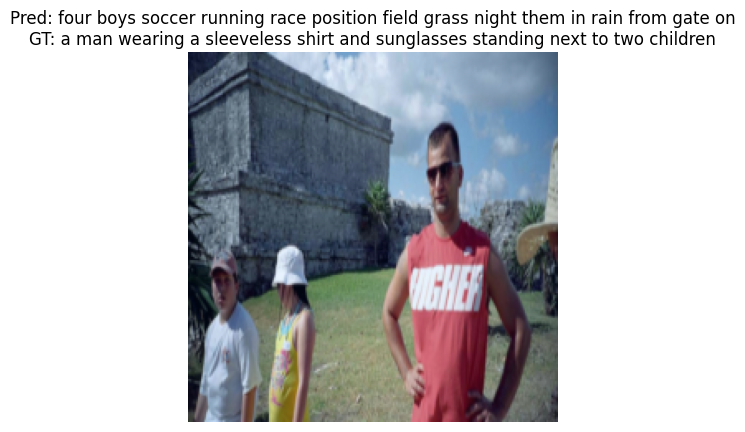

Epoch 23/50: 100%|██████████| 203/203 [00:31<00:00,  6.54it/s, loss=4.04]


[INFO] Checkpoint saved at epoch 22
Epoch 23/50, Loss: 3.9751


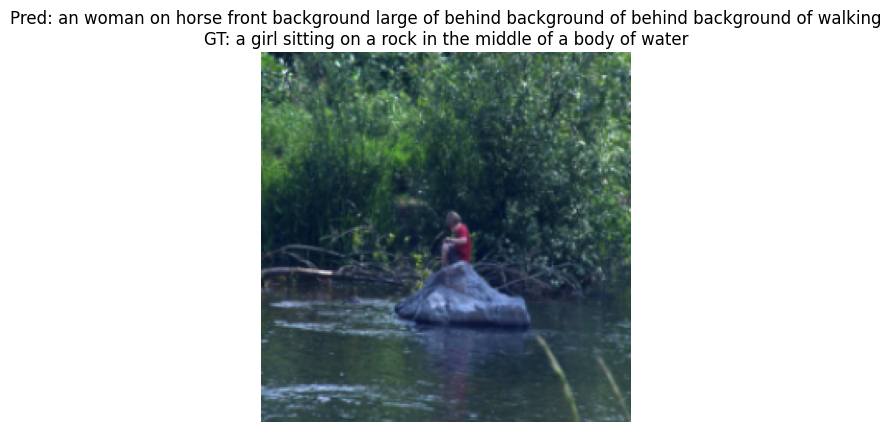

Epoch 24/50: 100%|██████████| 203/203 [00:31<00:00,  6.52it/s, loss=4.24]


[INFO] Checkpoint saved at epoch 23
Epoch 24/50, Loss: 3.9341


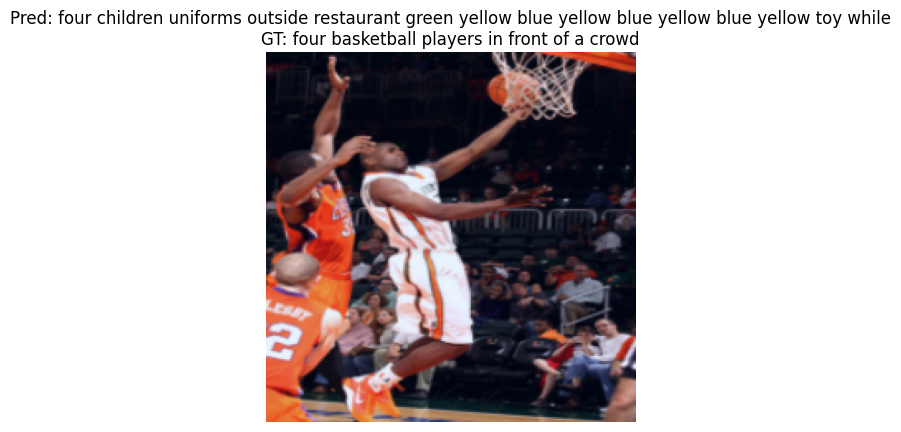

Epoch 25/50: 100%|██████████| 203/203 [00:30<00:00,  6.60it/s, loss=4.19]


[INFO] Checkpoint saved at epoch 24
Epoch 25/50, Loss: 3.9074


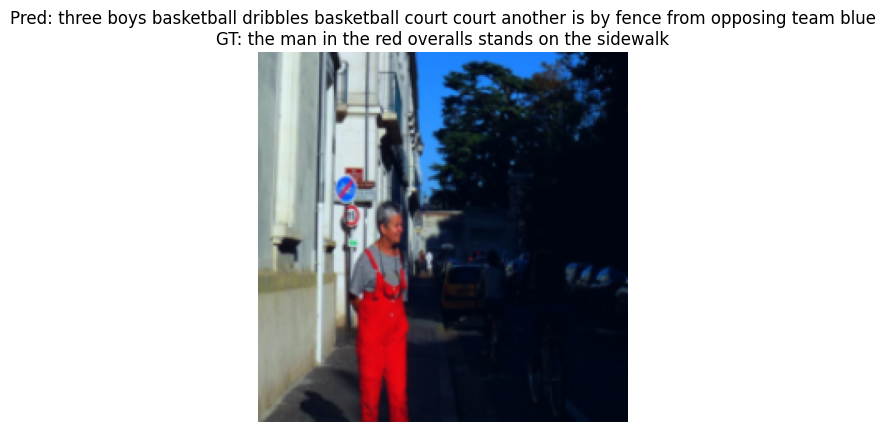

Epoch 26/50: 100%|██████████| 203/203 [00:30<00:00,  6.61it/s, loss=4.06]


[INFO] Checkpoint saved at epoch 25
Epoch 26/50, Loss: 3.8495


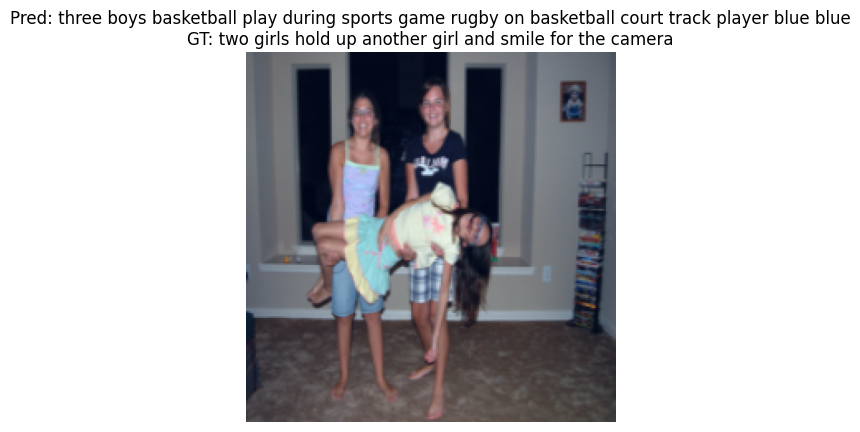

Epoch 27/50: 100%|██████████| 203/203 [00:30<00:00,  6.62it/s, loss=3.96]


[INFO] Checkpoint saved at epoch 26
Epoch 27/50, Loss: 3.8285


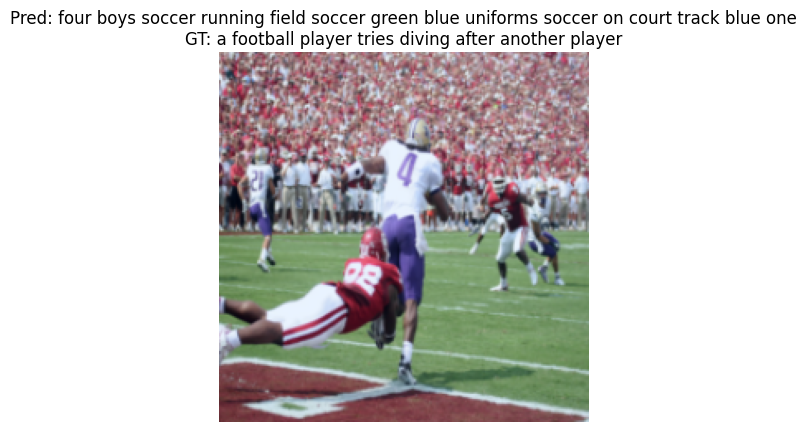

Epoch 28/50: 100%|██████████| 203/203 [00:30<00:00,  6.59it/s, loss=3.83]


[INFO] Checkpoint saved at epoch 27
Epoch 28/50, Loss: 3.8073


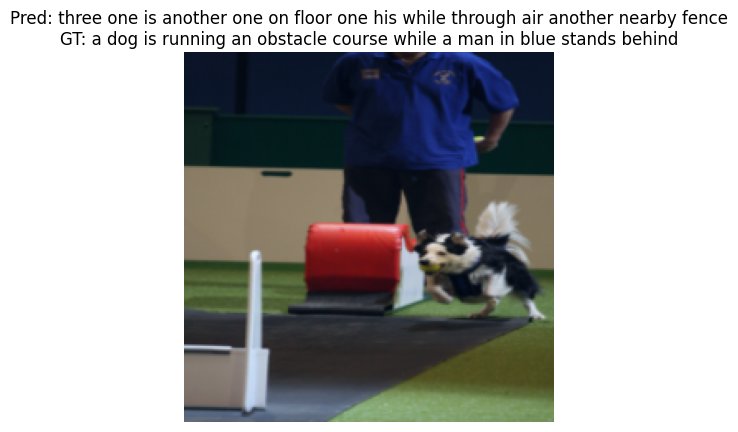

Epoch 29/50: 100%|██████████| 203/203 [00:30<00:00,  6.56it/s, loss=4.1] 


[INFO] Checkpoint saved at epoch 28
Epoch 29/50, Loss: 3.7646


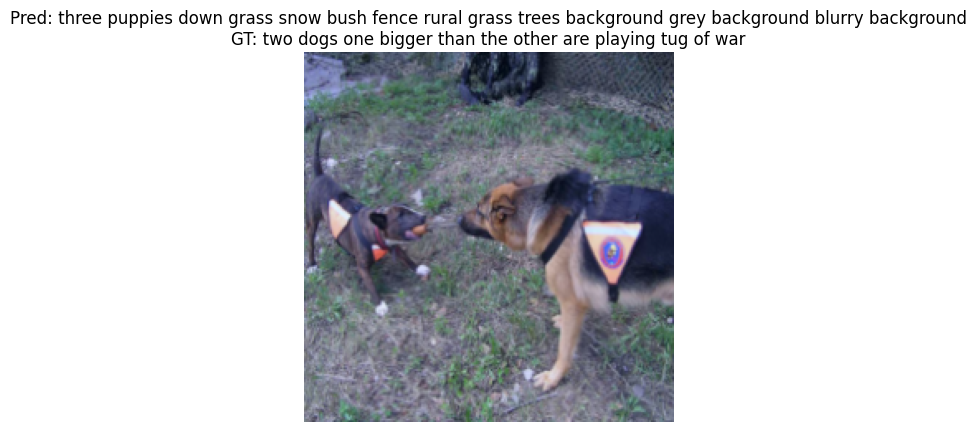

Epoch 30/50: 100%|██████████| 203/203 [00:30<00:00,  6.56it/s, loss=3.81]


[INFO] Checkpoint saved at epoch 29
Epoch 30/50, Loss: 3.7149


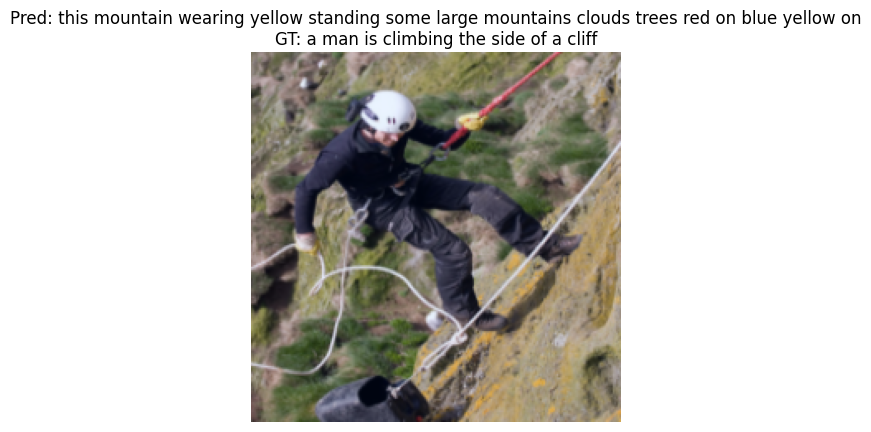

Epoch 31/50: 100%|██████████| 203/203 [00:31<00:00,  6.54it/s, loss=3.83]


[INFO] Checkpoint saved at epoch 30
Epoch 31/50, Loss: 3.6891


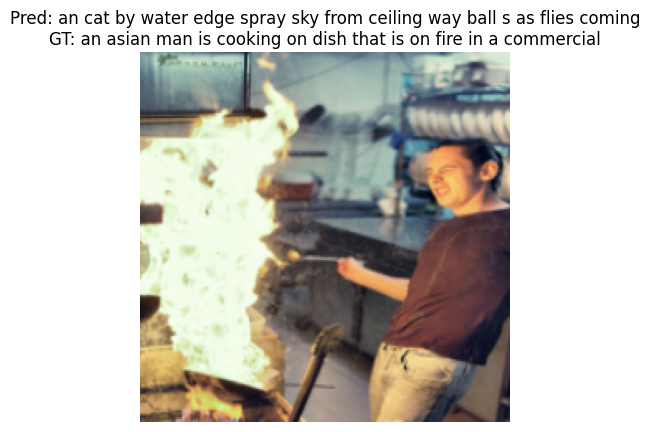

Epoch 32/50: 100%|██████████| 203/203 [00:31<00:00,  6.54it/s, loss=3.33]


[INFO] Checkpoint saved at epoch 31
Epoch 32/50, Loss: 3.6572


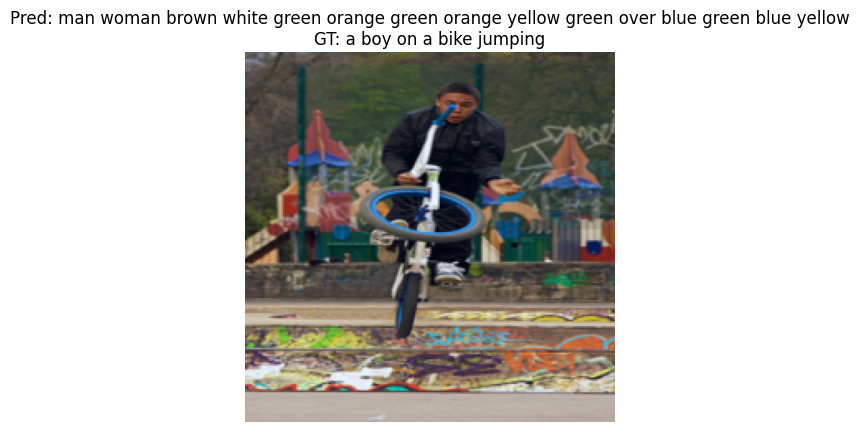

Epoch 33/50: 100%|██████████| 203/203 [00:31<00:00,  6.54it/s, loss=3.43]


[INFO] Checkpoint saved at epoch 32
Epoch 33/50, Loss: 3.6239


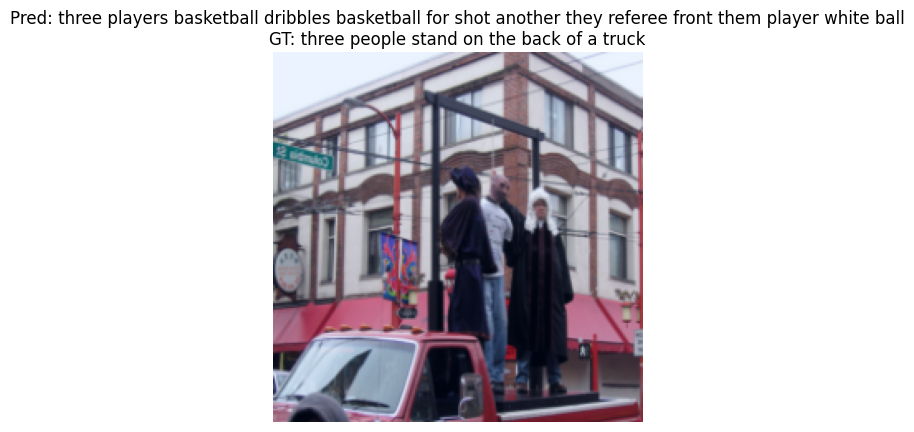

Epoch 34/50: 100%|██████████| 203/203 [00:30<00:00,  6.58it/s, loss=3.75]


[INFO] Checkpoint saved at epoch 33
Epoch 34/50, Loss: 3.5980


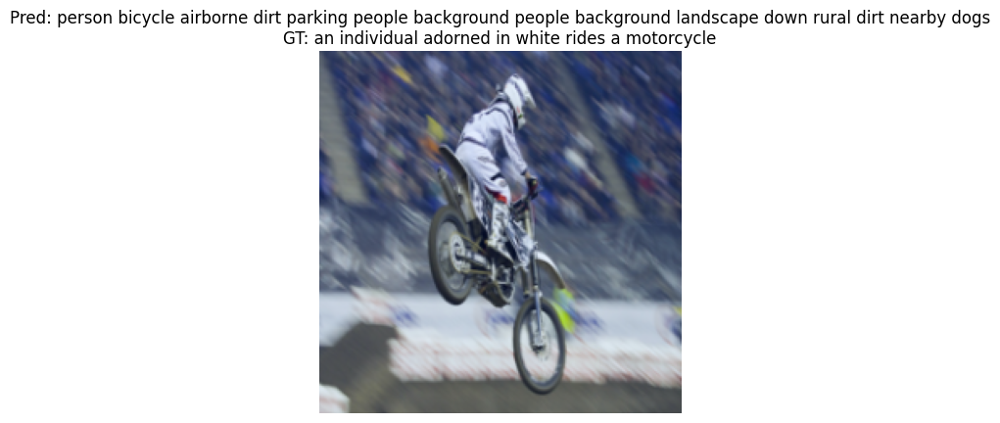

Epoch 35/50: 100%|██████████| 203/203 [00:30<00:00,  6.59it/s, loss=3.81]


[INFO] Checkpoint saved at epoch 34
Epoch 35/50, Loss: 3.5793


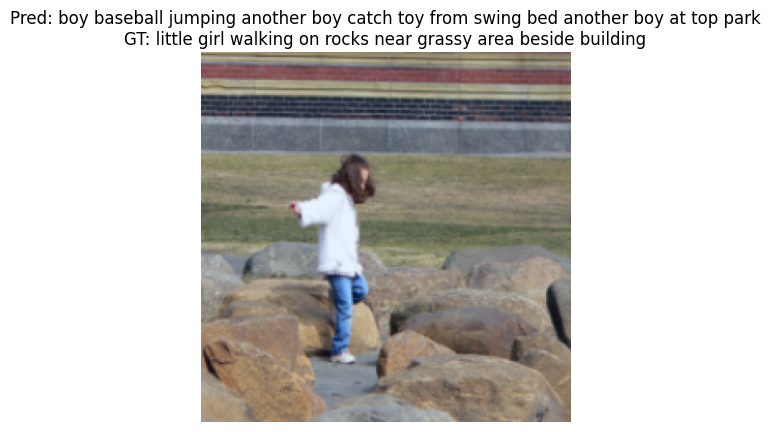

Epoch 36/50: 100%|██████████| 203/203 [00:30<00:00,  6.57it/s, loss=3.57]


[INFO] Checkpoint saved at epoch 35
Epoch 36/50, Loss: 3.5427


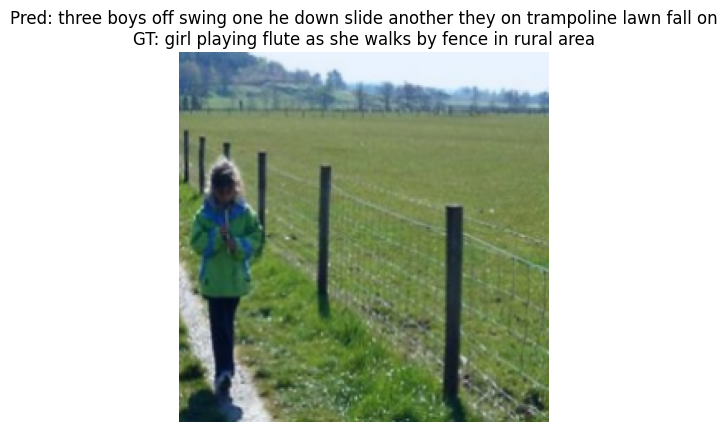

Epoch 37/50: 100%|██████████| 203/203 [00:30<00:00,  6.59it/s, loss=3.52]


[INFO] Checkpoint saved at epoch 36
Epoch 37/50, Loss: 3.5239


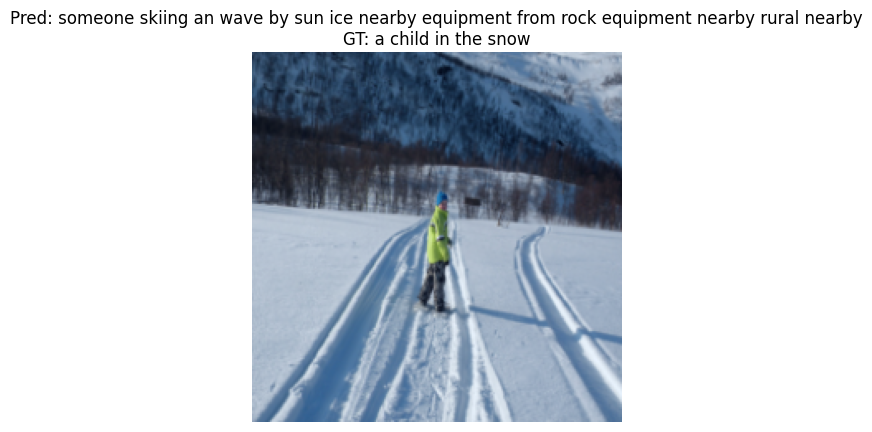

Epoch 38/50: 100%|██████████| 203/203 [00:30<00:00,  6.55it/s, loss=3.61]


[INFO] Checkpoint saved at epoch 37
Epoch 38/50, Loss: 3.4906


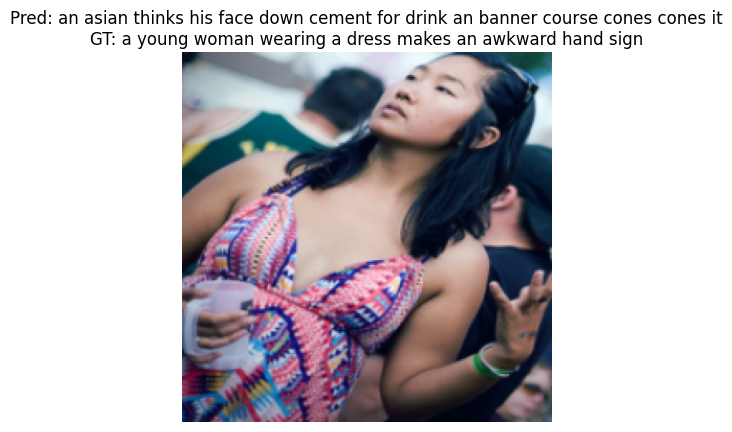

Epoch 39/50: 100%|██████████| 203/203 [00:30<00:00,  6.60it/s, loss=3.65]


[INFO] Checkpoint saved at epoch 38
Epoch 39/50, Loss: 3.4556


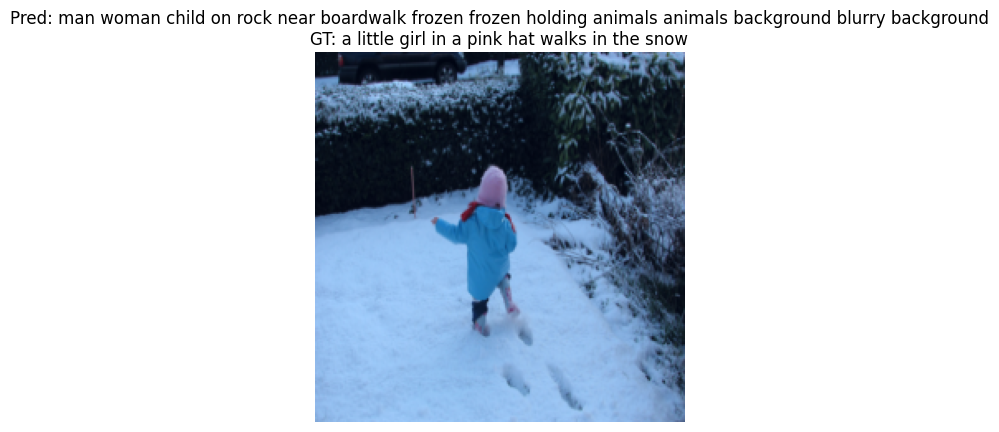

Epoch 40/50: 100%|██████████| 203/203 [00:30<00:00,  6.58it/s, loss=3.47]


[INFO] Checkpoint saved at epoch 39
Epoch 40/50, Loss: 3.4171


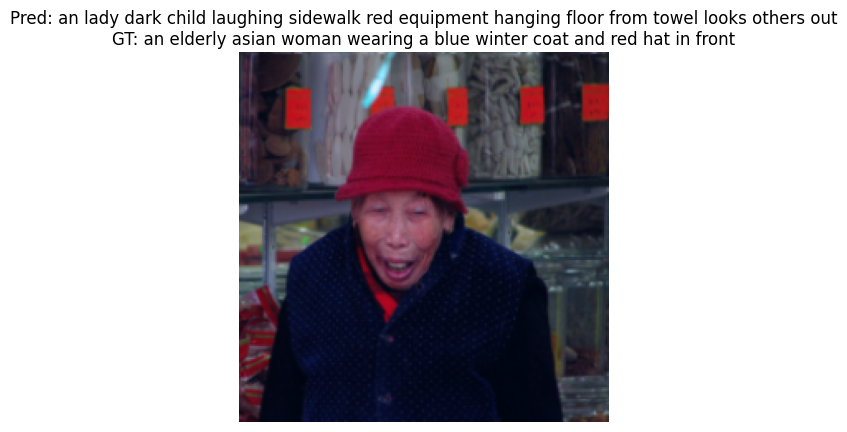

Epoch 41/50: 100%|██████████| 203/203 [00:31<00:00,  6.55it/s, loss=3.14]


[INFO] Checkpoint saved at epoch 40
Epoch 41/50, Loss: 3.4010


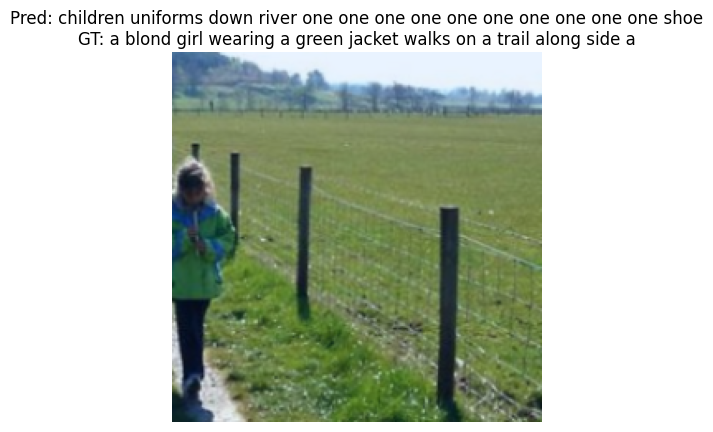

Epoch 42/50: 100%|██████████| 203/203 [00:31<00:00,  6.54it/s, loss=3.43]


[INFO] Checkpoint saved at epoch 41
Epoch 42/50, Loss: 3.3821


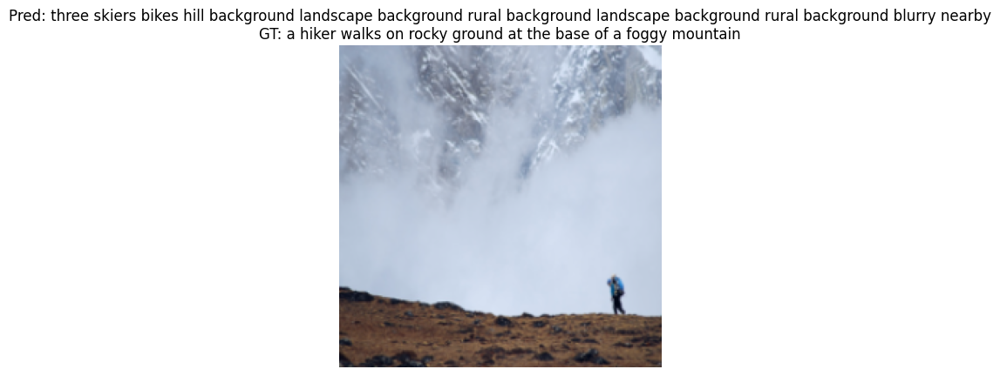

Epoch 43/50: 100%|██████████| 203/203 [00:30<00:00,  6.57it/s, loss=3.43]


[INFO] Checkpoint saved at epoch 42
Epoch 43/50, Loss: 3.3610


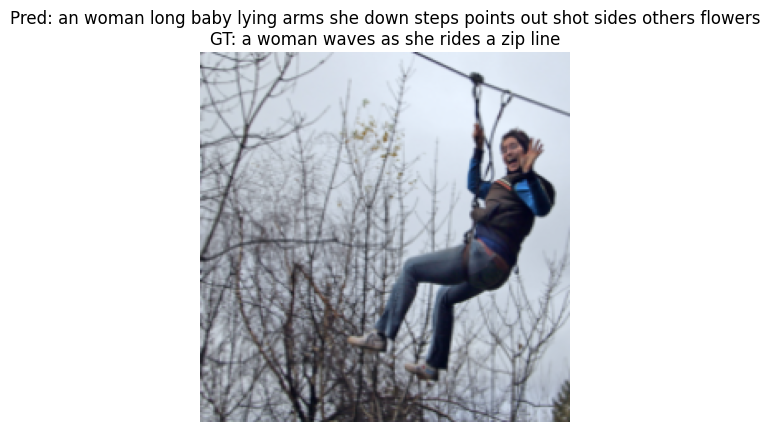

Epoch 44/50: 100%|██████████| 203/203 [00:31<00:00,  6.54it/s, loss=3.51]


[INFO] Checkpoint saved at epoch 43
Epoch 44/50, Loss: 3.3271


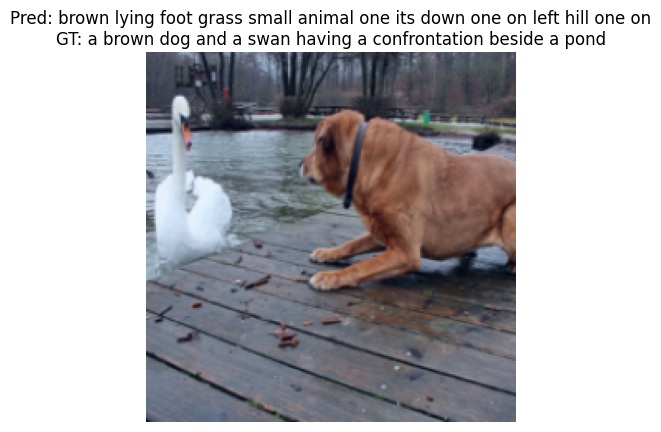

Epoch 45/50: 100%|██████████| 203/203 [00:30<00:00,  6.57it/s, loss=3.48]


[INFO] Checkpoint saved at epoch 44
Epoch 45/50, Loss: 3.3169


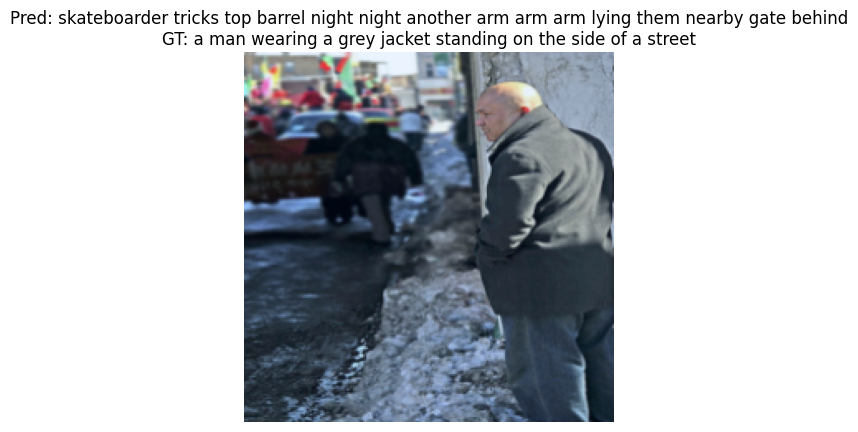

Epoch 46/50: 100%|██████████| 203/203 [00:30<00:00,  6.56it/s, loss=3.51]


[INFO] Checkpoint saved at epoch 45
Epoch 46/50, Loss: 3.2735


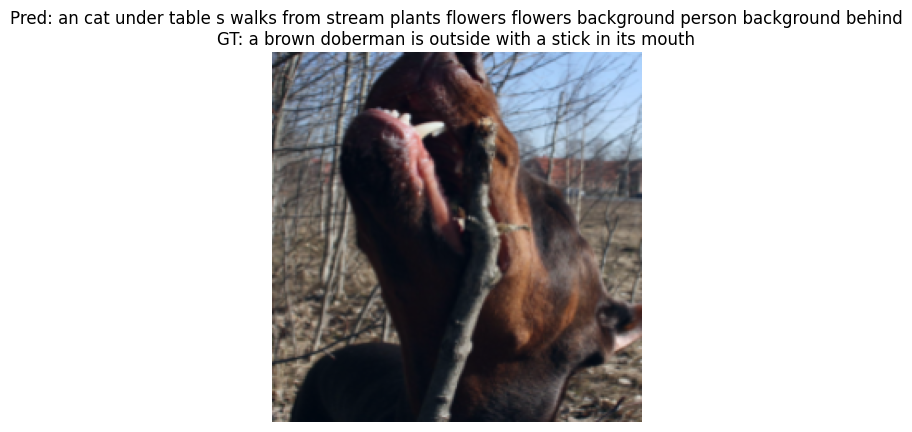

Epoch 47/50: 100%|██████████| 203/203 [00:31<00:00,  6.55it/s, loss=3.5] 


[INFO] Checkpoint saved at epoch 46
Epoch 47/50, Loss: 3.2643


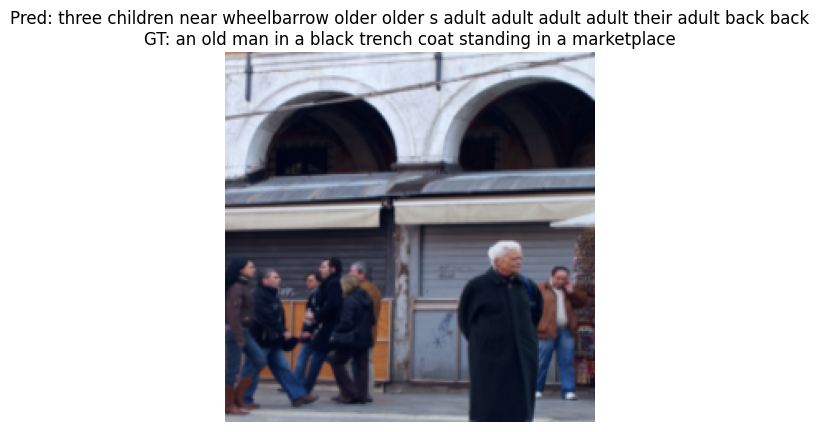

Epoch 48/50: 100%|██████████| 203/203 [00:30<00:00,  6.56it/s, loss=3.76]


[INFO] Checkpoint saved at epoch 47
Epoch 48/50, Loss: 3.2470


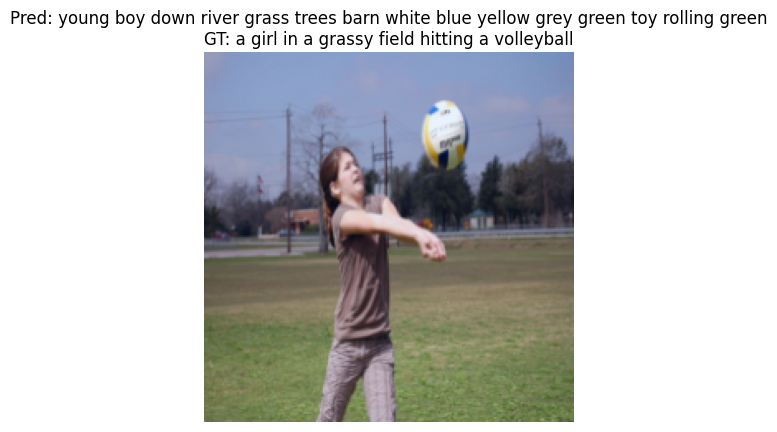

Epoch 49/50: 100%|██████████| 203/203 [00:30<00:00,  6.57it/s, loss=3.09]


[INFO] Checkpoint saved at epoch 48
Epoch 49/50, Loss: 3.2232


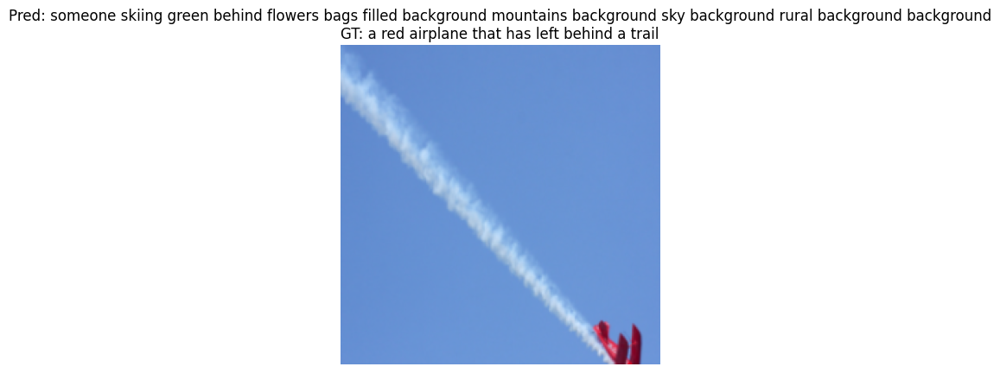

Epoch 50/50: 100%|██████████| 203/203 [00:31<00:00,  6.54it/s, loss=3.75]


[INFO] Checkpoint saved at epoch 49
Epoch 50/50, Loss: 3.2006


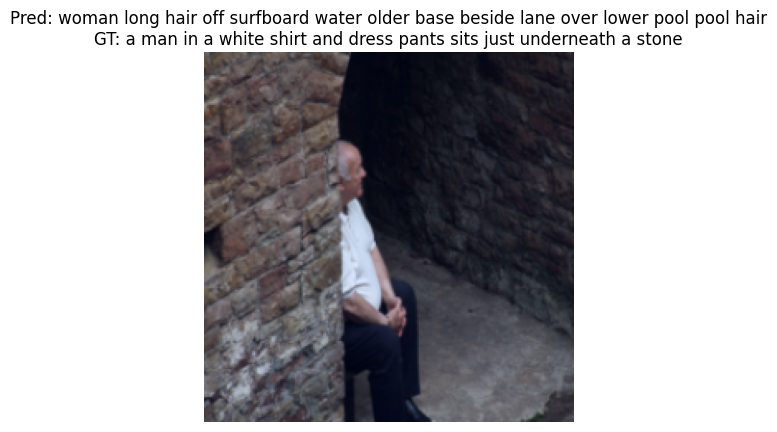

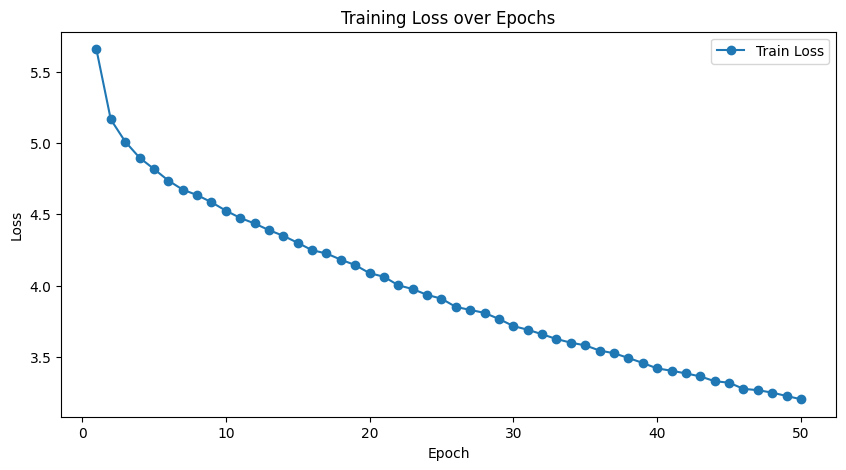

[INFO] Model training completed successfully.


In [29]:
from torch.utils.data import DataLoader, Dataset
import torch.nn as nn
import torch
import torch.optim as optim
import torchvision.models as models
from tqdm import tqdm
import torchvision.transforms as transforms

class Flickr8kDataset(Dataset):
    def __init__(self, captions_df, transform=None):
        self.captions_df = captions_df
        self.transform = transform

    def __len__(self):
        return len(self.captions_df)

    def __getitem__(self, idx):
        row = self.captions_df.iloc[idx]
        image = row.preprocessed_images
        if self.transform:
            image = self.transform(image)
        caption = torch.tensor(random.choice(row.tokenized_captions), dtype=torch.long)
        return image, caption

transform = transforms.Compose([
    transforms.RandomHorizontalFlip(),
    #transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1),
    transforms.RandomResizedCrop(224, scale=(0.8, 1.0))
])

# Create Data Loaders
train_dataset = Flickr8kDataset(train_df, transform=transform)
val_dataset = Flickr8kDataset(val_df)
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False)

# CNN Encoder using EfficientNet-B0
class EncoderCNN(nn.Module):
    def __init__(self, embed_size):
        super(EncoderCNN, self).__init__()
        self.model = models.efficientnet_b0(pretrained=True)
        self.model.classifier = nn.Identity()
        self.fc = nn.Linear(1280, embed_size)
        self.relu = nn.ReLU()
        self.first_call = True
    
    def forward(self, images):
        features = self.model(images)
        features = self.fc(features)
        features = self.relu(features)
        if self.first_call:
            print(f"[INFO] Encoder output shape: {features.shape}")  # Print output shape only once
            self.first_call = False
        return features

# RNN Decoder using LSTM
class DecoderRNN(nn.Module):
    def __init__(self, embed_size, hidden_size, vocab_size, num_layers=1):
        super(DecoderRNN, self).__init__()
        self.embedding = nn.Embedding(vocab_size, embed_size)
        self.lstm = nn.LSTM(embed_size, hidden_size, num_layers, batch_first=True)
        self.fc = nn.Linear(hidden_size, vocab_size)
        self.softmax = nn.LogSoftmax(dim=2)
        self.first_call = True
    
    def forward(self, features, captions):
        embeddings = self.embedding(captions)
        inputs = torch.cat((features.unsqueeze(1), embeddings), dim=1)
        outputs, _ = self.lstm(inputs)
        outputs = self.fc(outputs)
        if self.first_call:
            print(f"[INFO] Decoder output shape: {outputs.shape}")
            self.first_call = False
        return self.softmax(outputs)

# Complete Image Captioning Model
class ImageCaptioningModel(nn.Module):
    def __init__(self, embed_size, hidden_size, vocab_size, num_layers=1):
        super(ImageCaptioningModel, self).__init__()
        self.encoder = EncoderCNN(embed_size)
        self.decoder = DecoderRNN(embed_size, hidden_size, vocab_size, num_layers)
    
    def forward(self, images, captions):
        features = self.encoder(images)
        outputs = self.decoder(features, captions)
        return outputs

# Model Training Configuration
embed_size = 256
hidden_size = 512
vocab_size = len(vocab)
num_layers = 1

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = ImageCaptioningModel(embed_size, hidden_size, vocab_size, num_layers).to(device)
criterion = nn.CrossEntropyLoss(ignore_index=vocab['<pad>'], label_smoothing=0.1)
optimizer = optim.AdamW(model.parameters(), lr=0.001)
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=3, verbose=True)

# Checkpoint Function
def save_checkpoint(epoch, model, optimizer, loss, filename="checkpoint.pth"): 
    torch.save({
        'epoch': epoch,
        'model_state_dict': model.state_dict(),
        'optimizer_state_dict': optimizer.state_dict(),
        'loss': loss
    }, filename)
    print(f"[INFO] Checkpoint saved at epoch {epoch}")

import random


def beam_search(model, image, vocab, beam_size=10, max_length=15):
    model.eval()
    image = image.unsqueeze(0).to(device)
    feature = model.encoder(image)
    sequences = [[list(), 1.0]]  # (sequence, score)
    for _ in range(max_length):
        all_candidates = []
        for seq, score in sequences:
            if len(seq) > 0 and seq[-1] == vocab['<eos>']:
                all_candidates.append((seq, score))
                continue
            input_seq = torch.tensor([seq], dtype=torch.long).to(device)
            with torch.no_grad():
                output = model.decoder(feature, input_seq)
            probabilities = torch.exp(output[:, -1, :])
            topk_probs, topk_idxs = probabilities.topk(beam_size)
            for i in range(beam_size):
                candidate = seq + [topk_idxs[0, i].item()]
                candidate_score = score * topk_probs[0, i].item()
                all_candidates.append((candidate, candidate_score))
        sequences = sorted(all_candidates, key=lambda x: x[0], reverse=True)[:beam_size]
    return sequences[0][0]

# Decode Tokenized Caption
def decode_caption(tokenized_caption, vocab):
    index_to_word = {idx: word for word, idx in vocab.items()}
    return ' '.join([index_to_word[idx] for idx in tokenized_caption if idx not in {vocab['<sos>'], vocab['<eos>'], vocab['<pad>']}])


def train_model(model, train_loader, criterion, optimizer, scheduler, num_epochs=50):
    model.train()
    train_losses = []
    for epoch in range(num_epochs):
        model.train()
        epoch_loss = 0
        progress_bar = tqdm(train_loader, desc=f"Epoch {epoch+1}/{num_epochs}")
        for images, captions in progress_bar:
            images, captions = images.to(device), captions.to(device)
            optimizer.zero_grad()
            outputs = model(images, captions[:, :-1])
            outputs = outputs[:, :-1, :].contiguous().view(-1, vocab_size)
            targets = captions[:, 1:].contiguous().view(-1)
            loss = criterion(outputs, targets)
            loss.backward()
            optimizer.step()
            epoch_loss += loss.item()
            progress_bar.set_postfix(loss=loss.item())
        scheduler.step(epoch_loss / len(train_loader))
        train_losses.append(epoch_loss / len(train_loader))
        save_checkpoint(epoch, model, optimizer, epoch_loss / len(train_loader))
        print(f"Epoch {epoch+1}/{num_epochs}, Loss: {epoch_loss/len(train_loader):.4f}")
        
        # Display Sample Output at End of Epoch
        sample_images, sample_captions = next(iter(train_loader))
        sample_image = sample_images[0].to(device)
        sample_caption_gt = decode_caption(sample_captions[0].cpu().numpy(), vocab)
        with torch.no_grad():
            sample_caption_tokens = beam_search(model, sample_image, vocab, beam_size=5)
        sample_caption_pred = decode_caption(sample_caption_tokens, vocab)

        preprocessed_image = sample_image.permute(1, 2, 0).cpu().numpy()
        preprocessed_image = (preprocessed_image - preprocessed_image.min()) / (preprocessed_image.max() - preprocessed_image.min())
        plt.imshow(preprocessed_image)
        plt.axis("off")
        plt.title(f"Pred: {sample_caption_pred}\nGT: {sample_caption_gt}")
        plt.show()
    
    # Plot Training Loss
    plt.figure(figsize=(10, 5))
    plt.plot(range(1, num_epochs+1), train_losses, marker='o', linestyle='-', label='Train Loss')
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.title("Training Loss over Epochs")
    plt.legend()
    plt.show()

# Start Training
train_model(model, train_loader, criterion, optimizer, scheduler, num_epochs=50)

print("[INFO] Model training completed successfully.")
torch.save(model, "image_captioning_model_full.pth")
print("[INFO] Model saved successfully as 'image_captioning_model_full.pth'")

<ipython-input-63-ff2d9c60cd15>:92: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model = torch.load("image_captioning_model_full.pth")
<ipython-input-63-ff2d9c60cd15>:50: U

[INFO] Model loaded successfully.

[INFO] Evaluation on Validation dataset:
BLEU-1 Score: 0.3020
BLEU-2 Score: 0.1417
BLEU-3 Score: 0.0716
BLEU-4 Score: 0.0368
ROUGE-L Score: 0.3071


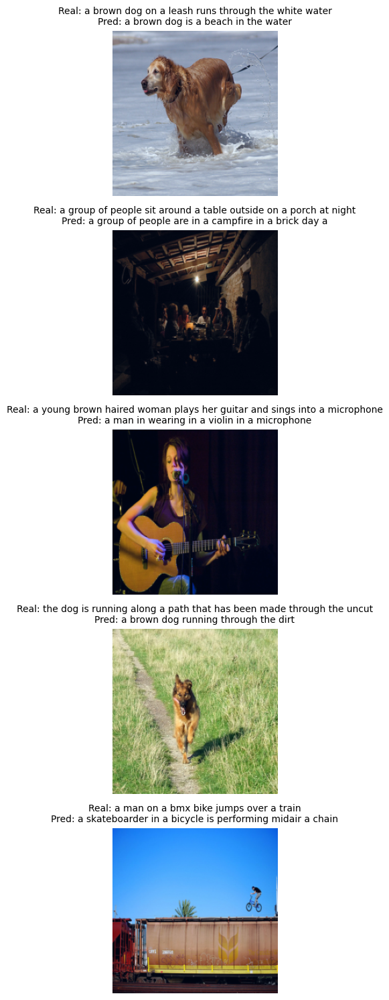


[INFO] Evaluation on Test dataset:
BLEU-1 Score: 0.3006
BLEU-2 Score: 0.1394
BLEU-3 Score: 0.0678
BLEU-4 Score: 0.0337
ROUGE-L Score: 0.3056


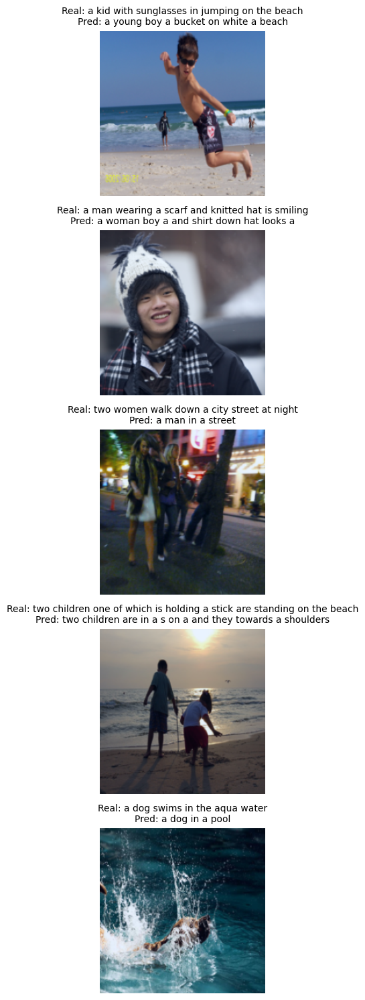

In [63]:
import torch
from nltk.translate.bleu_score import corpus_bleu, SmoothingFunction
from rouge_score import rouge_scorer
import random
import numpy as np
import matplotlib.pyplot as plt

model_save_path = "/kaggle/working/image_captioning_model_full.pth"

def compute_bleu_scores(references, hypotheses):
    smoothie = SmoothingFunction().method1
    bleu1 = corpus_bleu(references, hypotheses, weights=(1.0, 0, 0, 0), smoothing_function=smoothie)
    bleu2 = corpus_bleu(references, hypotheses, weights=(0.5, 0.5, 0, 0), smoothing_function=smoothie)
    bleu3 = corpus_bleu(references, hypotheses, weights=(0.33, 0.33, 0.33, 0), smoothing_function=smoothie)
    bleu4 = corpus_bleu(references, hypotheses, weights=(0.25, 0.25, 0.25, 0.25), smoothing_function=smoothie)
    return bleu1, bleu2, bleu3, bleu4

def compute_rouge_scores(references, hypotheses):
    scorer = rouge_scorer.RougeScorer(['rougeL'], use_stemmer=True)
    rouge_l_scores = [scorer.score(" ".join(refs[0]), " ".join(hyp))['rougeL'].fmeasure for refs, hyp in zip(references, hypotheses)]
    return np.mean(rouge_l_scores)

def clean_caption(tokenized_caption, vocab):
    idx_to_word = {v: k for k, v in vocab.items()}
    words = []
    last_word = None  
    
    for idx in tokenized_caption:
        if idx in {vocab["<sos>"], vocab["<pad>"]}: 
            continue
        if idx == vocab["<eos>"]:  
             break
        
        word = idx_to_word.get(idx, "<unk>")
        if word != last_word:  
            words.append(word)
        last_word = word
    
    return words

def evaluate_model(model, data_loader, vocab, dataset_name):
    model.eval()
    references = []
    hypotheses = []
    images_samples = []
    
    with torch.no_grad():
        for images, captions in data_loader:
            images = images.to(device)
            captions = torch.tensor(captions, dtype=torch.long, device=device)
            
            outputs = model(images, captions[:, :-1])
            predicted_tokens = outputs.argmax(dim=-1).cpu().tolist()
            captions = captions.cpu().numpy().tolist()
            
            references.extend(captions)
            hypotheses.extend(predicted_tokens)
            images_samples.extend(images.cpu())

    ref_texts = [[clean_caption(ref, vocab)] for ref in references]
    hyp_texts = [clean_caption(hyp, vocab) for hyp in hypotheses]
    
    bleu1, bleu2, bleu3, bleu4 = compute_bleu_scores(ref_texts, hyp_texts)
    rouge_l = compute_rouge_scores(ref_texts, hyp_texts)    
    print(f"\n[INFO] Evaluation on {dataset_name} dataset:")
    print(f"BLEU-1 Score: {bleu1:.4f}")
    print(f"BLEU-2 Score: {bleu2:.4f}")
    print(f"BLEU-3 Score: {bleu3:.4f}")
    print(f"BLEU-4 Score: {bleu4:.4f}")
    print(f"ROUGE-L Score: {rouge_l:.4f}")
    
    num_samples = 5
    selected_indices = random.sample(range(len(images_samples)), num_samples)
    
    fig, axes = plt.subplots(num_samples, 1, figsize=(8, num_samples * 3))
    if num_samples == 1:
        axes = [axes]
    
    for i, idx in enumerate(selected_indices):
        img = images_samples[idx].permute(1, 2, 0).numpy()
        img = (img - img.min()) / (img.max() - img.min())
        ref_caption = " ".join(ref_texts[idx][0])
        hyp_caption = " ".join(hyp_texts[idx])

        axes[i].imshow(img)
        axes[i].axis("off")
        axes[i].set_title(f"Real: {ref_caption}\nPred: {hyp_caption}", fontsize=10)
    
    plt.tight_layout()
    plt.show()

model = torch.load("image_captioning_model_full.pth")
model.to(device)
model.eval()
print("[INFO] Model loaded successfully.")

test_dataset = Flickr8kDataset(test_df, transform=transform)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=True)

evaluate_model(model, val_loader, vocab, "Validation")
evaluate_model(model, test_loader, vocab, "Test")
